In [1]:
import resource

In [2]:
from PIL import Image

In [3]:
from io import BytesIO

In [4]:
from sys import platform

In [5]:
import numpy as np

In [6]:
import tensorflow as tf

In [7]:
session = tf.InteractiveSession()

In [8]:
def print_memory_usage():
    # Unix only
    # On Linux the result is in kilobytes
    mem_usage = resource.getrusage(resource.RUSAGE_SELF).ru_maxrss
    if platform == 'darwin':
        # On MacOS the result is in bytes, divide by 1024 to get it in kilobytes
        mem_usage = resource.getrusage(resource.RUSAGE_SELF).ru_maxrss / 1024

    mem_usage = mem_usage / 1024
    print("{mem} Mb".format(mem=mem_usage))

In [9]:
print_memory_usage()

94.6875 Mb


In [10]:
X = tf.constant(np.random.randint(256, size=(10000, 1000, 1)))

In [11]:
print_memory_usage()

247.359375 Mb


In [12]:
Y = tf.to_float(X)

In [13]:
evaluated_Y = Y.eval()
print(evaluated_Y)

[[[  66.]
  [ 108.]
  [ 107.]
  ..., 
  [ 179.]
  [ 136.]
  [ 242.]]

 [[ 190.]
  [ 178.]
  [ 131.]
  ..., 
  [  57.]
  [  56.]
  [ 151.]]

 [[  46.]
  [ 115.]
  [  53.]
  ..., 
  [ 240.]
  [ 199.]
  [ 129.]]

 ..., 
 [[ 181.]
  [ 169.]
  [ 192.]
  ..., 
  [  26.]
  [ 104.]
  [ 181.]]

 [[ 173.]
  [ 203.]
  [   1.]
  ..., 
  [  89.]
  [  13.]
  [  25.]]

 [[ 197.]
  [  93.]
  [  95.]
  ..., 
  [ 151.]
  [  40.]
  [  49.]]]


In [14]:
print_memory_usage()

629.6328125 Mb


In [15]:
jpeg_image = tf.image.encode_jpeg(tf.cast(X, tf.uint8))

In [16]:
print_memory_usage()

629.67578125 Mb


In [17]:
im = Image.open(BytesIO(jpeg_image.eval()))

In [18]:
print_memory_usage()

941.8828125 Mb


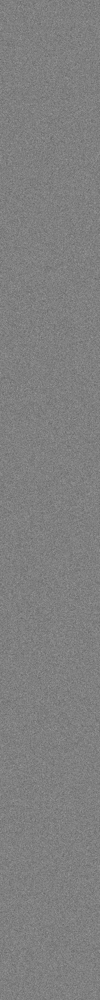

In [19]:
im

In [20]:
session.close()